# Hard Mining Analysis

## Note:

Our Object Detection Model class has a `save_prediction` method that saves predictions to a file. This class does have a score_threshold parameter that is defaulted at 0, so any prediction that has a confidence of greater than 0 will be saved. We defined the raw output predictions as being >0 confidence becuase the model outputs several thousand predictions for some images with scores = 0 that made the prediction dataset too large.

In [1]:
# Append system path
import sys, os
sys.path.append(os.path.abspath('../inference'))
sys.path.append(os.path.abspath('../rectification'))


import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Import Model and NMS classes
from object_detection import Model

# Initialize models for both YOLO versions
model_1 = Model(weights_file="../storage/yolo_model_1/yolov4-tiny-logistics_size_416_1.weights", 
                config_file="../storage/yolo_model_1/yolov4-tiny-logistics_size_416_1.cfg", 
                names_file="../storage/yolo_model_1/logistics.names")

model_2 = Model(weights_file="../storage/yolo_model_2/yolov4-tiny-logistics_size_416_2.weights", 
                config_file="../storage/yolo_model_2/yolov4-tiny-logistics_size_416_2.cfg", 
                names_file="../storage/yolo_model_2/logistics.names")

### Define Image Paths and Sort

In [2]:
# Path to the test images and labels
image_dir = "../storage/logistics/"
image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.jpg')]
label_paths = [f.replace('.jpg', '.txt') for f in image_paths]

# Sort both the image_paths and label_paths based on the image filenames 
image_paths.sort(key=lambda x: os.path.splitext(os.path.basename(x))[0])
label_paths.sort(key=lambda x: os.path.splitext(os.path.basename(x))[0])

### Create Predictions Folder

In [3]:
# output_path = '../storage/predictions_full'
# for image_path in image_paths:
#     # Extract just the filename without the extension
#     image_filename = os.path.splitext(os.path.basename(image_path))[0]
#     # Read the image
#     image = cv.imread(image_path)
#     image_height, image_width = image.shape[:2]
#     outputs, original_size = model_2.predict(image)
#     model_2.save_predictions(outputs, original_size, output_path, image_filename)

### Initialize HardNegativeMining Class

In [4]:
from hard_negative_mining import HardNegativeMining

hm = HardNegativeMining(iou_threshold=0.5, lambda_bb=1, lambda_obj=1, lambda_cls=1, lambda_no_obj=2)

In [5]:

prediction_dir = '../storage/predictions_full/'
prediction_paths = [os.path.join(prediction_dir, f) for f in os.listdir(prediction_dir) if f.endswith('.txt')]
prediction_paths.sort(key=lambda x: os.path.splitext(os.path.basename(x))[0])

In [6]:
def test_sample_hard_negatives(prediction_dir, annotation_image_dir, num_samples, hm):
    """
    Test the sample_hard_negatives method from the HardNegativeMining class and return the corresponding images with losses.
    
    :param prediction_dir: Directory containing predicted YOLO bounding boxes (.txt).
    :param annotation_image_dir: Directory containing both the annotations (.txt) and the images (.jpg).
    :param num_samples: Number of hard negatives to return.
    :param hm: Initialized HardNegativeMining object.
    
    :return: List of tuples (image_path, loss) for the top hard negatives.
    """
    hard_negatives = hm.sample_hard_negatives(prediction_dir, annotation_image_dir, num_samples)
    
    # Prepare list to store the image paths and their corresponding losses
    results = []

    for pred_file, loss in hard_negatives:
        # Get the image file name from the prediction file (replace .txt with .jpg)
        image_filename = os.path.splitext(pred_file)[0] + '.jpg'
        image_path = os.path.join(annotation_image_dir, image_filename)
        
        # Check if the image file exists
        if os.path.exists(image_path):
            results.append((image_path, loss))
        else:
            print(f"Warning: Image {image_filename} does not exist.")
    
    return results


# Obtain hard negative results
hard_negatives_results = test_sample_hard_negatives(
    prediction_dir='../storage/predictions_full/',
    annotation_image_dir='../storage/logistics/',  
    num_samples=10,  
    hm=hm  # HardNegativeMining object
)

In [7]:
# Print the image paths and their corresponding losses outside of the function
for image_path, loss in hard_negatives_results:
    print(f"Image: {image_path}, Loss: {loss:.6f}")

Image: ../storage/logistics/387a749f761852d0_jpg.rf.00080ecac3fb871dc5f936dab4fe9d80.jpg, Loss: 22.000000
Image: ../storage/logistics/EAN13_09_0088_jpg.rf.2031e0c46b10aaa695a811ce27f1ef56.jpg, Loss: 21.375287
Image: ../storage/logistics/Img_web_555_jpg.rf.29fb8649096f57f40d9456b2ab6bd8c1.jpg, Loss: 21.365474
Image: ../storage/logistics/621-jpg__jpg_jpg.rf.23ce21d5f284132e5a37ea742622b97c.jpg, Loss: 21.335702
Image: ../storage/logistics/007118_jpg.rf.08eb2afd28293afc0f53474348b3ccab.jpg, Loss: 21.331186
Image: ../storage/logistics/LDR08AW1FPEB_jpg.rf.c23f27058cde6dd65c8f29d62d9a8e37.jpg, Loss: 21.320602
Image: ../storage/logistics/LDR08AW1FPEB_jpg.rf.321e7a024d64f32232980dbb1ddcab3c.jpg, Loss: 21.297516
Image: ../storage/logistics/WEJCF41ZFDDZ_jpg.rf.e72efe631ba5047517bc8012cbb302f6.jpg, Loss: 21.289732
Image: ../storage/logistics/fire1_mp4-313_jpg.rf.63396291379b3c704d855a3d9ce07e6b.jpg, Loss: 21.245449
Image: ../storage/logistics/74_resized_jpg.rf.da320b1886aebd8a6dac9fd79ca3578c.jpg,

In [8]:
def display_image_with_boxes(image, bboxes, class_ids, scores, model, title="Predictions"):
    """Function to display image with bounding boxes (converted from YOLO format)."""
    h, w = image.shape[:2]  # Get image dimensions

    for i, bbox in enumerate(bboxes):
        cx, cy, bw, bh = bbox  # YOLO format: center_x, center_y, width, height (normalized)
        
        # Convert from YOLO format (normalized) to pixel coordinates
        x1 = int((cx - bw / 2) * w)  # Top-left x
        y1 = int((cy - bh / 2) * h)  # Top-left y
        x2 = int((cx + bw / 2) * w)  # Bottom-right x
        y2 = int((cy + bh / 2) * h)  # Bottom-right y

        # Create label for the class and confidence score
        label = f"{model.classes[class_ids[i]]}: {scores[i]:.2f}"
        
        # Draw the rectangle on the image
        cv.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        
        # Add the label text above the bounding box
        cv.putText(image, label, (x1, y1 - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Convert image to RGB for matplotlib display
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    
    # Plot the image with bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(image_rgb)
    plt.title(title)
    plt.axis("off")  # Hide axes
    plt.show()


def display_images_with_gt_and_predictions(hard_negatives_results, hm, model, annotation_image_dir, prediction_dir):
    """
    Display images with ground truth and predicted bounding boxes labeled.
    
    :param hard_negatives_results: List of tuples (image_path, loss) from the sample_hard_negatives function.
    :param hm: Initialized HardNegativeMining object.
    :param model: The model object with class names to label the boxes.
    :param annotation_image_dir: Directory containing both the annotations (.txt) and the images (.jpg).
    :param prediction_dir: Directory containing predicted YOLO bounding boxes (.txt).
    """
    for image_path, _ in hard_negatives_results:
        image_filename = os.path.basename(image_path).replace('.jpg', '.txt')

        # Read the image
        image = cv.imread(image_path)
        img_height, img_width = image.shape[:2]

        # Read ground truth and predicted labels
        annotation_file = os.path.join(annotation_image_dir, image_filename)  # Ground truth
        prediction_file = os.path.join(prediction_dir, image_filename)  # Predictions

        ground_truth_labels = hm.read_yolo_labels(annotation_file)
        predicted_labels = hm.read_yolo_labels(prediction_file)

        # Ground truth boxes and class IDs
        gt_bboxes = [label[1:5] for label in ground_truth_labels]
        gt_class_ids = [label[0] for label in ground_truth_labels]

        # Predicted boxes, class IDs, and scores
        pred_bboxes = [label[1:5] for label in predicted_labels]
        pred_class_ids = [label[0] for label in predicted_labels]
        pred_scores = [label[5] for label in predicted_labels]  # Confidence scores

        # Display ground truth
        print(f"Displaying Ground Truth for Image: {image_path}")
        display_image_with_boxes(image.copy(), gt_bboxes, gt_class_ids, [1.0]*len(gt_class_ids), model, title="Ground Truth")

        # Display predictions
        print(f"Displaying Predictions for Image: {image_path}")
        display_image_with_boxes(image.copy(), pred_bboxes, pred_class_ids, pred_scores, model, title="Predictions")



## Display Hard Negative Mining Images (Top 20 highest losses)

Displaying Ground Truth for Image: ../storage/logistics/387a749f761852d0_jpg.rf.00080ecac3fb871dc5f936dab4fe9d80.jpg


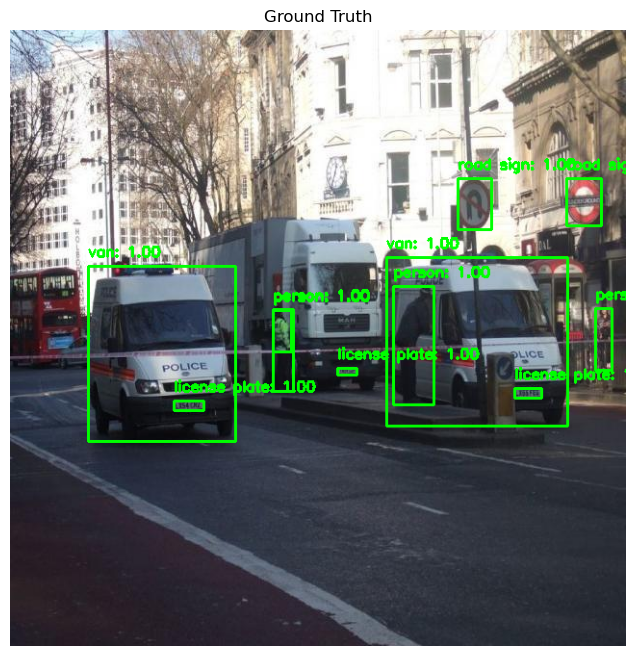

Displaying Predictions for Image: ../storage/logistics/387a749f761852d0_jpg.rf.00080ecac3fb871dc5f936dab4fe9d80.jpg


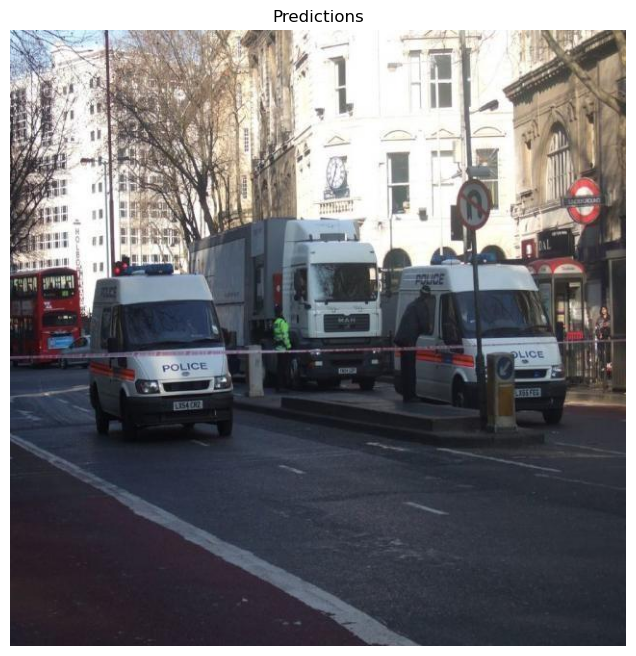

Displaying Ground Truth for Image: ../storage/logistics/EAN13_09_0088_jpg.rf.2031e0c46b10aaa695a811ce27f1ef56.jpg


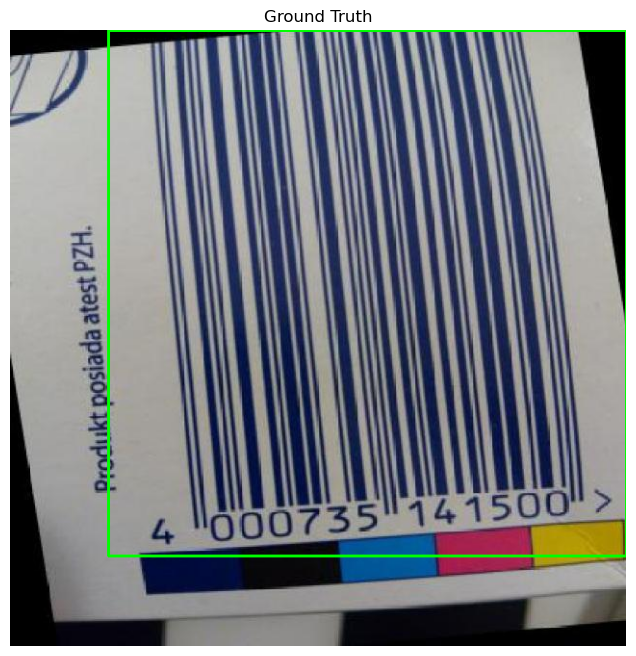

Displaying Predictions for Image: ../storage/logistics/EAN13_09_0088_jpg.rf.2031e0c46b10aaa695a811ce27f1ef56.jpg


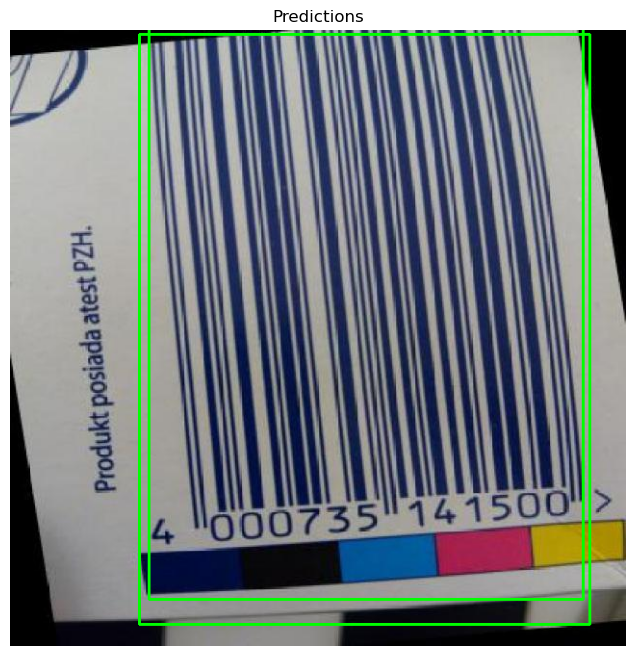

Displaying Ground Truth for Image: ../storage/logistics/Img_web_555_jpg.rf.29fb8649096f57f40d9456b2ab6bd8c1.jpg


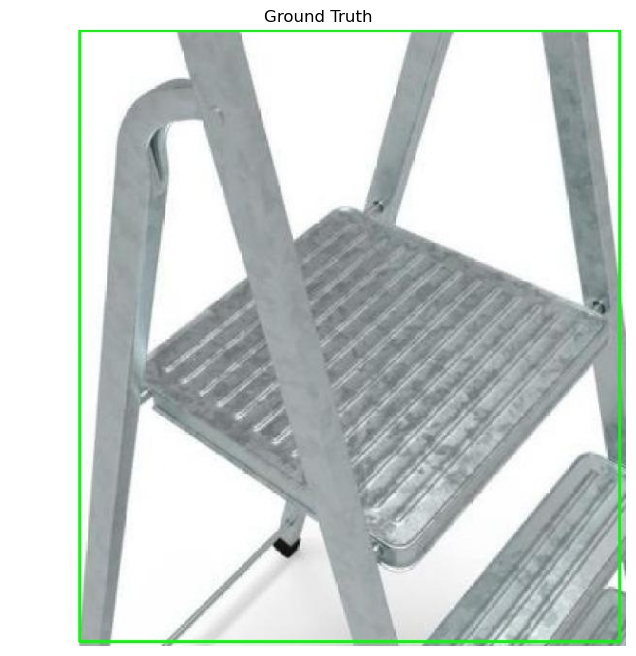

Displaying Predictions for Image: ../storage/logistics/Img_web_555_jpg.rf.29fb8649096f57f40d9456b2ab6bd8c1.jpg


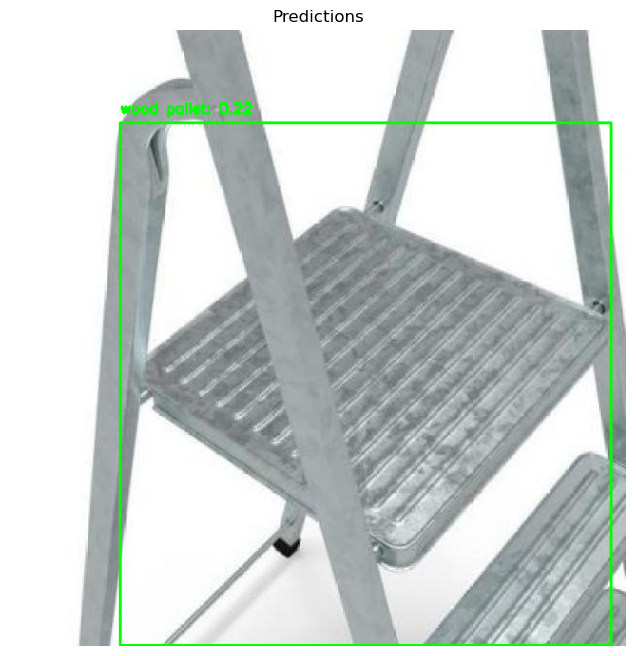

Displaying Ground Truth for Image: ../storage/logistics/621-jpg__jpg_jpg.rf.23ce21d5f284132e5a37ea742622b97c.jpg


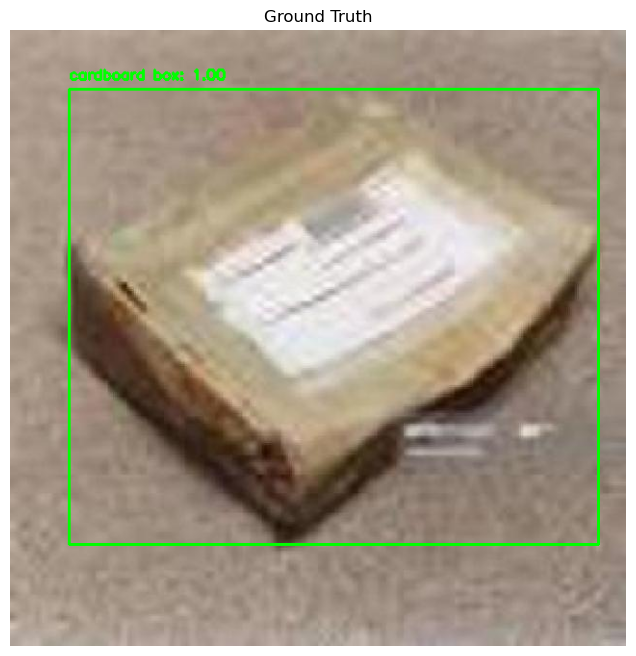

Displaying Predictions for Image: ../storage/logistics/621-jpg__jpg_jpg.rf.23ce21d5f284132e5a37ea742622b97c.jpg


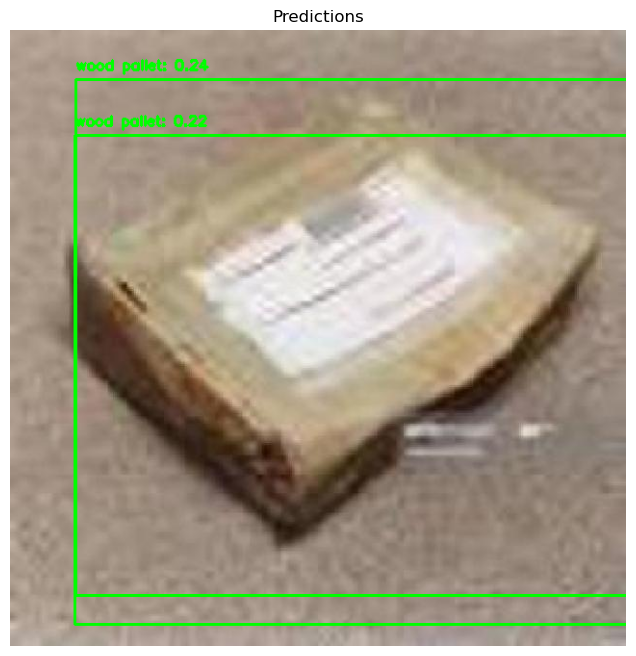

Displaying Ground Truth for Image: ../storage/logistics/007118_jpg.rf.08eb2afd28293afc0f53474348b3ccab.jpg


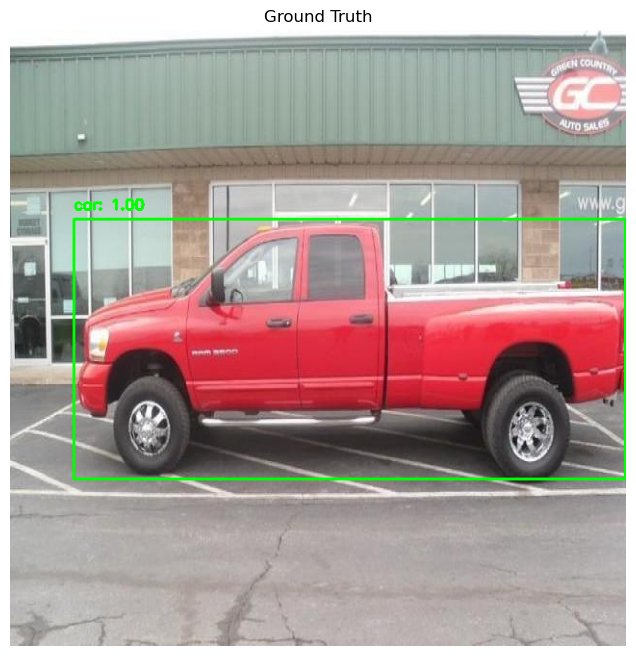

Displaying Predictions for Image: ../storage/logistics/007118_jpg.rf.08eb2afd28293afc0f53474348b3ccab.jpg


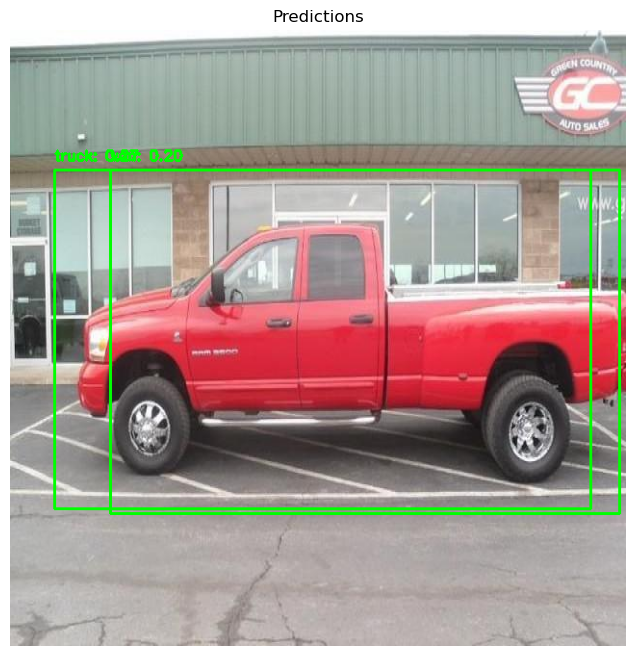

Displaying Ground Truth for Image: ../storage/logistics/LDR08AW1FPEB_jpg.rf.c23f27058cde6dd65c8f29d62d9a8e37.jpg


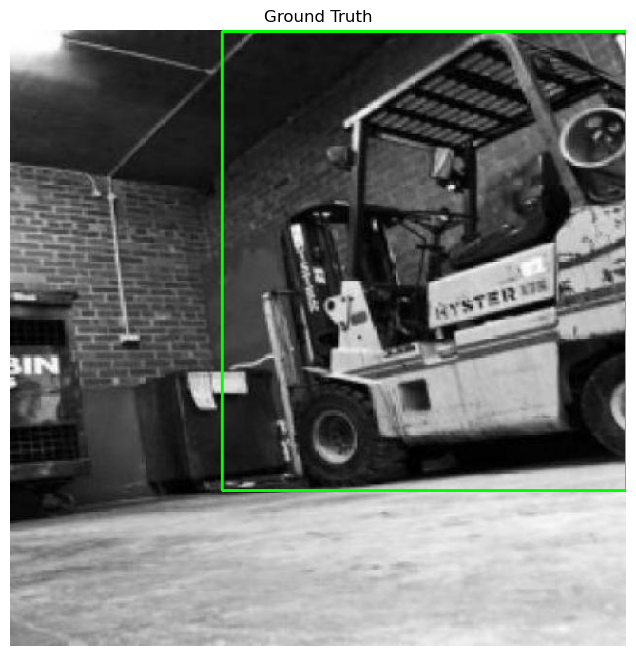

Displaying Predictions for Image: ../storage/logistics/LDR08AW1FPEB_jpg.rf.c23f27058cde6dd65c8f29d62d9a8e37.jpg


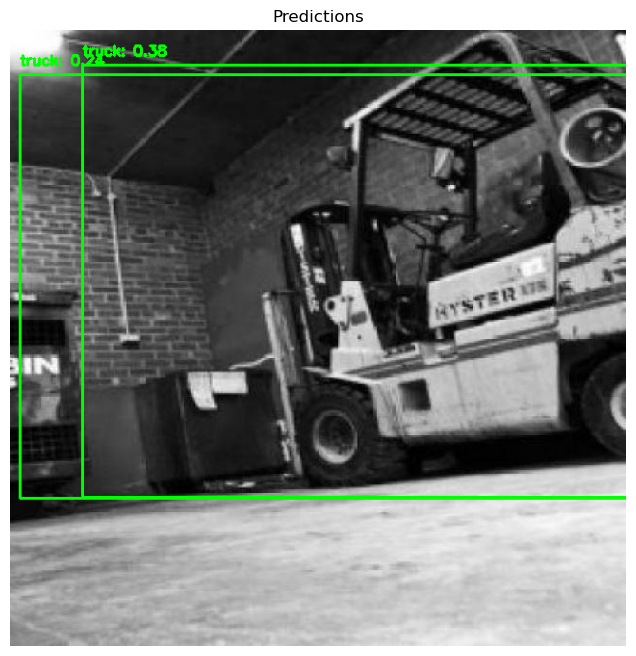

Displaying Ground Truth for Image: ../storage/logistics/LDR08AW1FPEB_jpg.rf.321e7a024d64f32232980dbb1ddcab3c.jpg


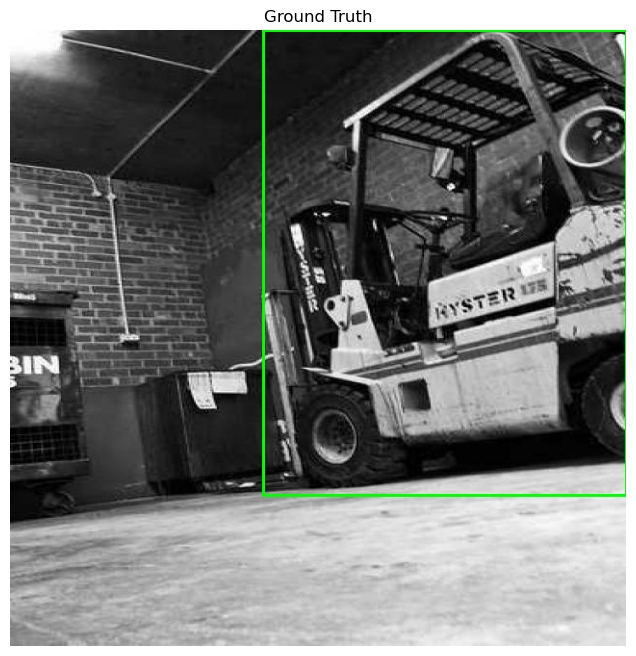

Displaying Predictions for Image: ../storage/logistics/LDR08AW1FPEB_jpg.rf.321e7a024d64f32232980dbb1ddcab3c.jpg


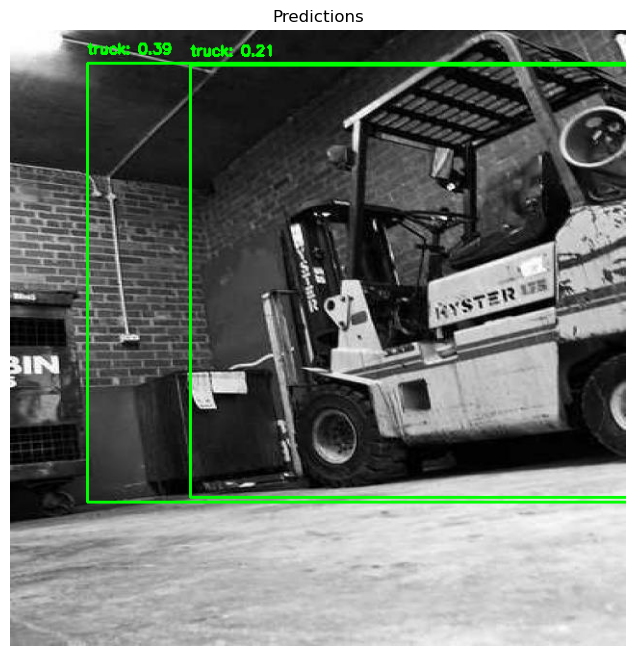

Displaying Ground Truth for Image: ../storage/logistics/WEJCF41ZFDDZ_jpg.rf.e72efe631ba5047517bc8012cbb302f6.jpg


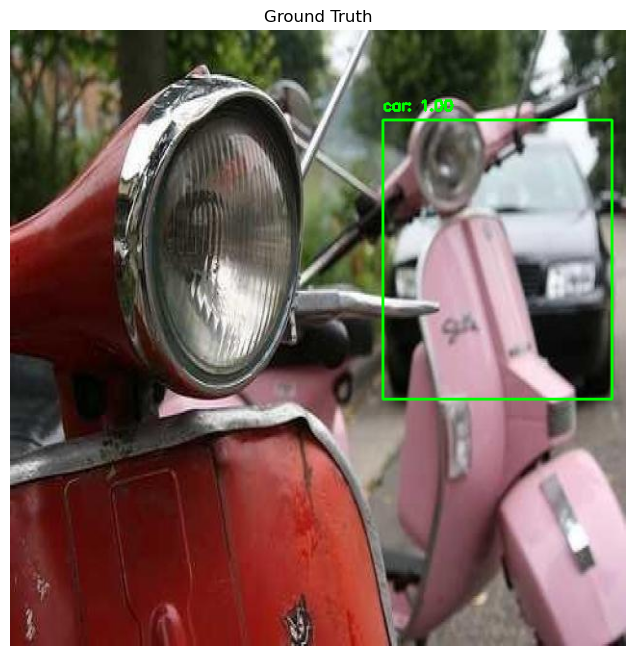

Displaying Predictions for Image: ../storage/logistics/WEJCF41ZFDDZ_jpg.rf.e72efe631ba5047517bc8012cbb302f6.jpg


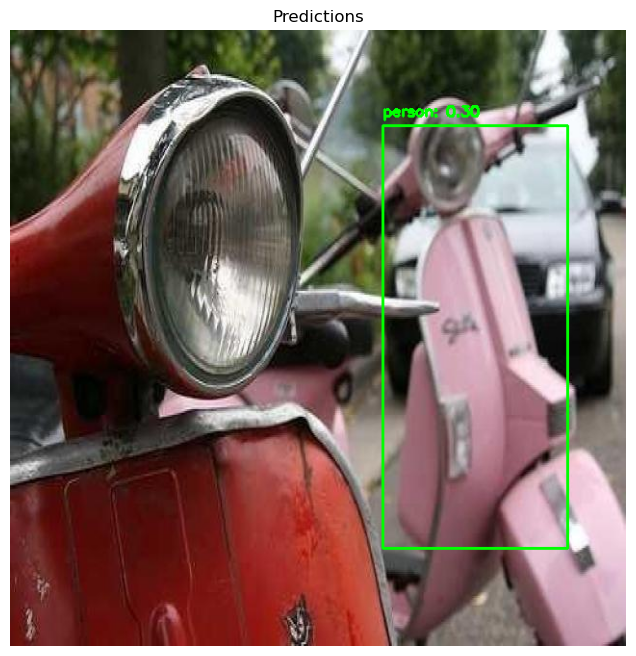

Displaying Ground Truth for Image: ../storage/logistics/fire1_mp4-313_jpg.rf.63396291379b3c704d855a3d9ce07e6b.jpg


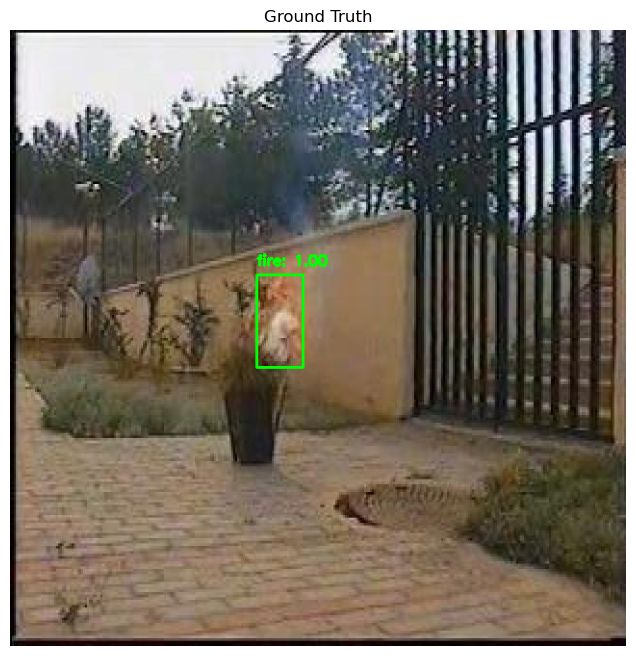

Displaying Predictions for Image: ../storage/logistics/fire1_mp4-313_jpg.rf.63396291379b3c704d855a3d9ce07e6b.jpg


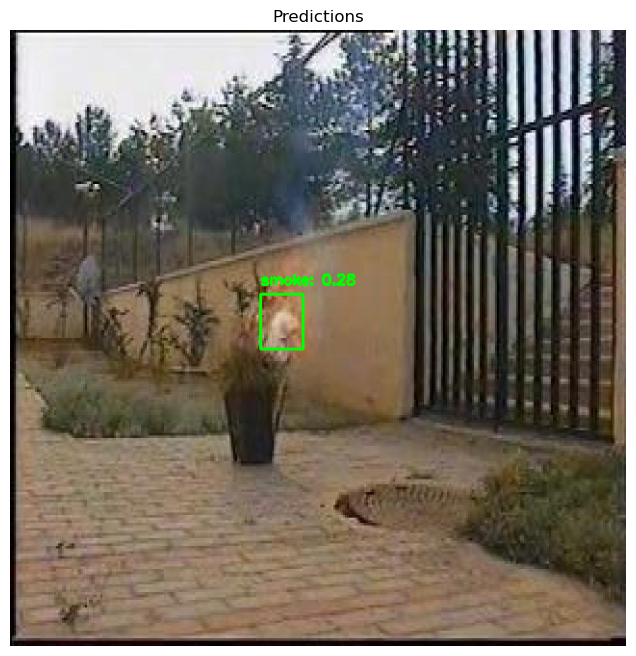

Displaying Ground Truth for Image: ../storage/logistics/74_resized_jpg.rf.da320b1886aebd8a6dac9fd79ca3578c.jpg


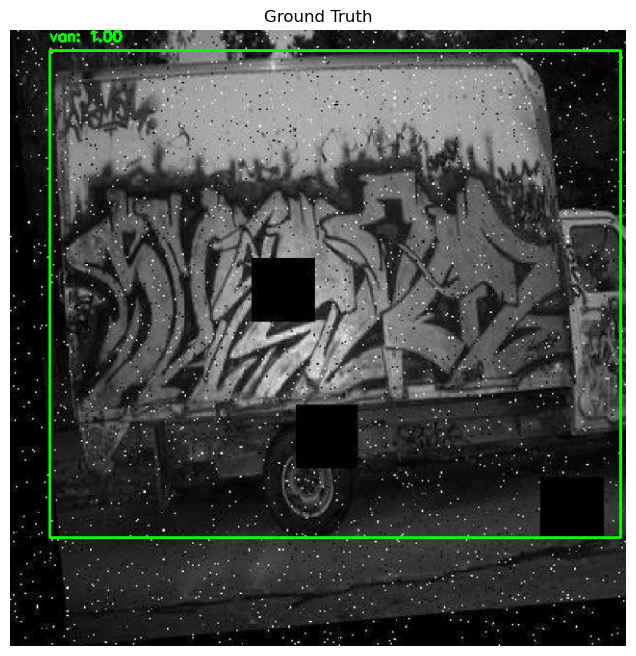

Displaying Predictions for Image: ../storage/logistics/74_resized_jpg.rf.da320b1886aebd8a6dac9fd79ca3578c.jpg


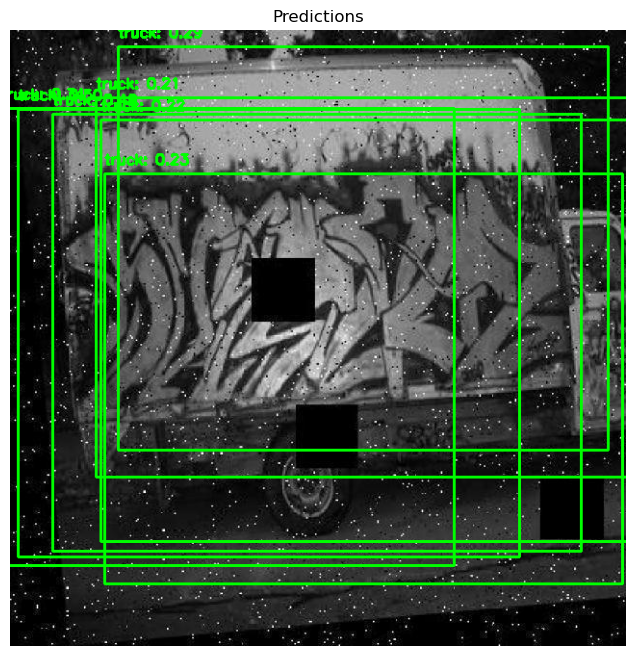

In [9]:
# Display the images with ground truth and predictions
display_images_with_gt_and_predictions(
    hard_negatives_results=hard_negatives_results, 
    hm=hm, 
    model=model_2, 
    annotation_image_dir='../storage/logistics/',  
    prediction_dir='../storage/predictions_full/'
)

In [10]:
hm = HardNegativeMining(iou_threshold=0.2, lambda_bb=1, lambda_obj=1, lambda_cls=1, lambda_no_obj=1)

In [11]:
# Obtain hard negative results
hard_negatives_results = test_sample_hard_negatives(
    prediction_dir='../storage/predictions_full/',
    annotation_image_dir='../storage/logistics/',  
    num_samples=10,  
    hm=hm  # HardNegativeMining object
)

Displaying Ground Truth for Image: ../storage/logistics/EAN13_09_0046_jpg.rf.ef5bf723c1e9c7cd0ea248b8d300f7a7.jpg


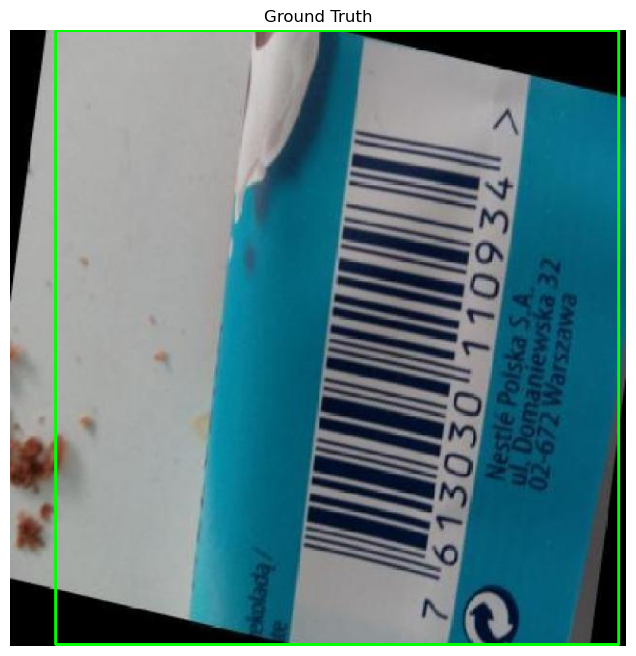

Displaying Predictions for Image: ../storage/logistics/EAN13_09_0046_jpg.rf.ef5bf723c1e9c7cd0ea248b8d300f7a7.jpg


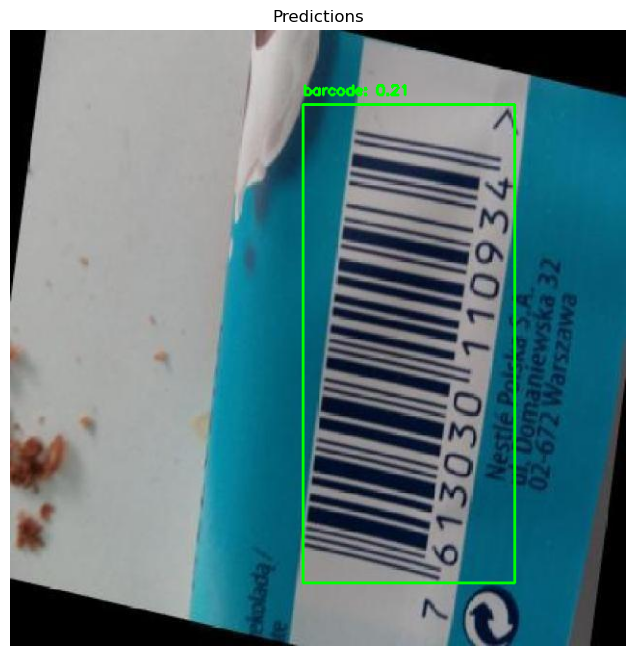

Displaying Ground Truth for Image: ../storage/logistics/pt-label_2181_jpg.rf.b0f02db9d3fb8820b5a24342299da911.jpg


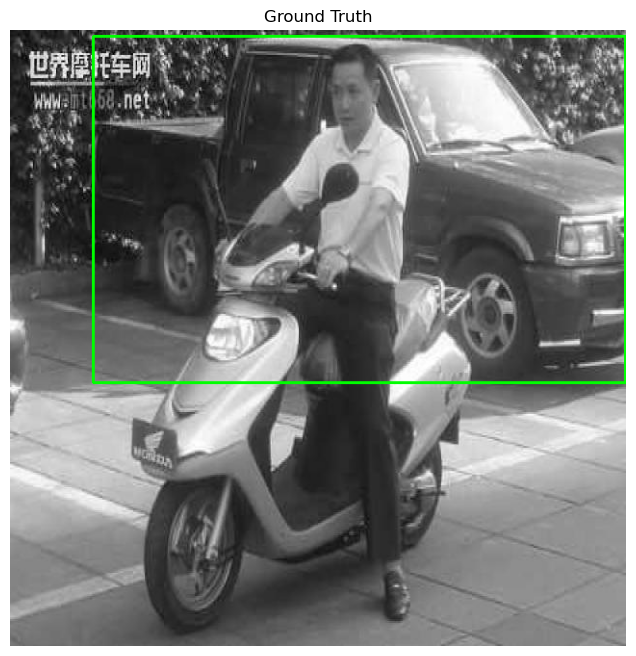

Displaying Predictions for Image: ../storage/logistics/pt-label_2181_jpg.rf.b0f02db9d3fb8820b5a24342299da911.jpg


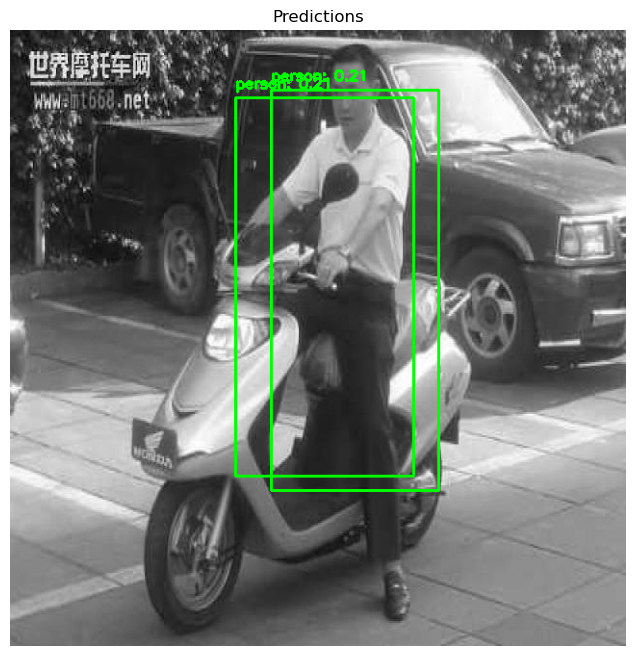

Displaying Ground Truth for Image: ../storage/logistics/2008_007264_jpg.rf.7c30b01b256f4f7b9db9053c8cbdd2d4.jpg


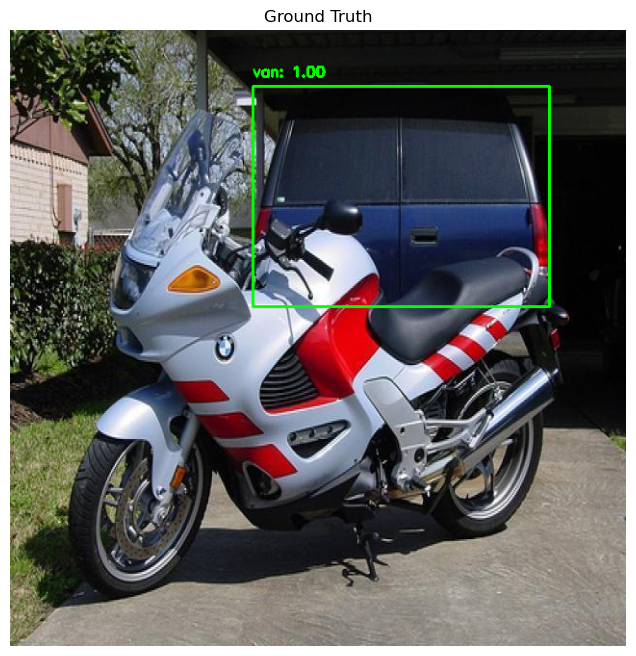

Displaying Predictions for Image: ../storage/logistics/2008_007264_jpg.rf.7c30b01b256f4f7b9db9053c8cbdd2d4.jpg


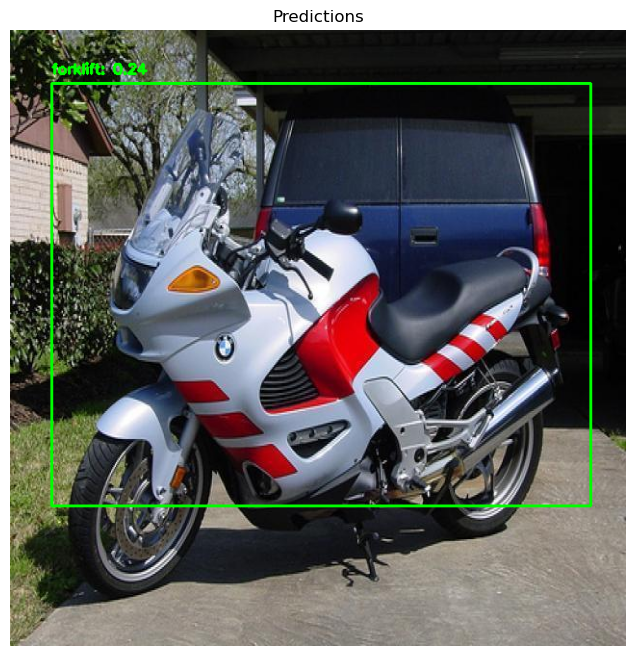

Displaying Ground Truth for Image: ../storage/logistics/4000823061109-01_N95-2592x1944_scaledTo640x480bilinear_jpg.rf.b6c4137e8d79155c3652554f5f2b1d0d.jpg


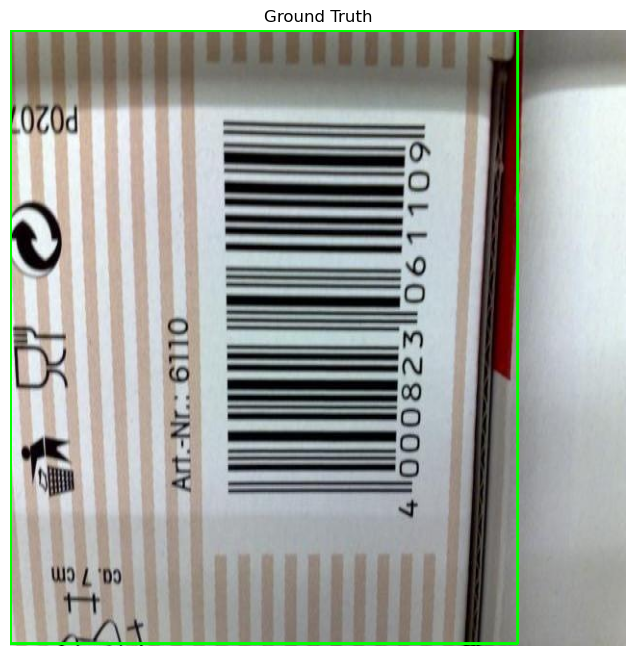

Displaying Predictions for Image: ../storage/logistics/4000823061109-01_N95-2592x1944_scaledTo640x480bilinear_jpg.rf.b6c4137e8d79155c3652554f5f2b1d0d.jpg


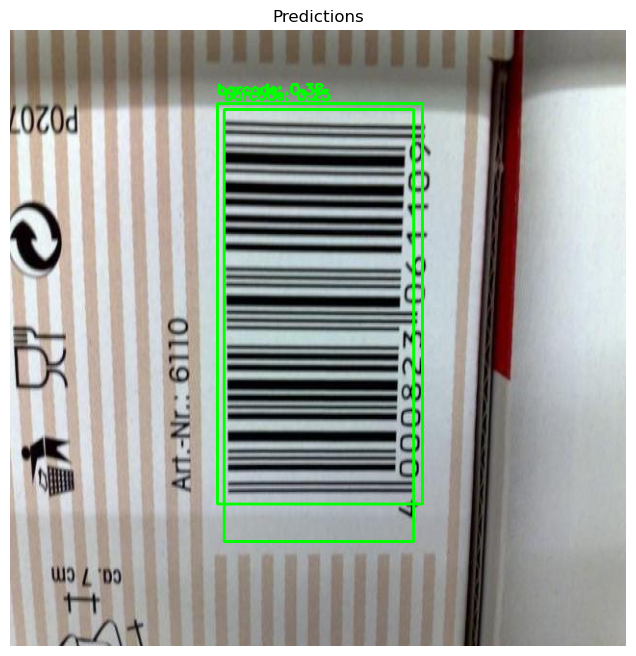

Displaying Ground Truth for Image: ../storage/logistics/GG8NXVSJAC6J_jpg.rf.c3bab807ff70a51b06e6c0394d0f438e.jpg


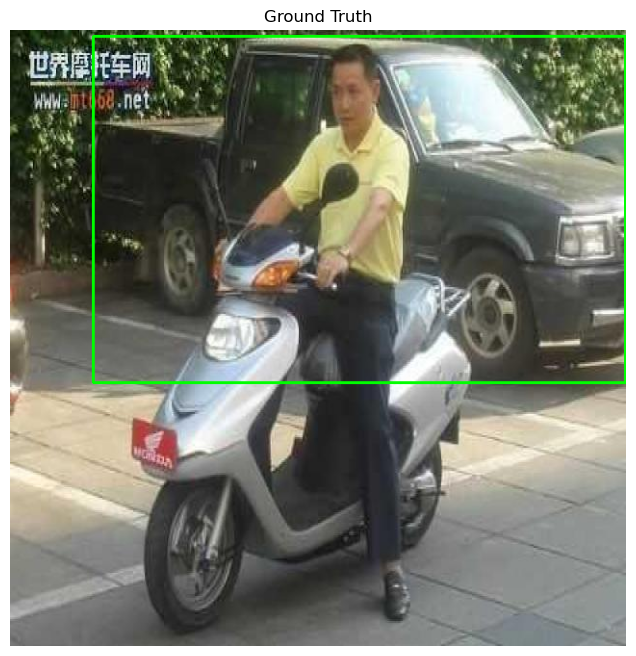

Displaying Predictions for Image: ../storage/logistics/GG8NXVSJAC6J_jpg.rf.c3bab807ff70a51b06e6c0394d0f438e.jpg


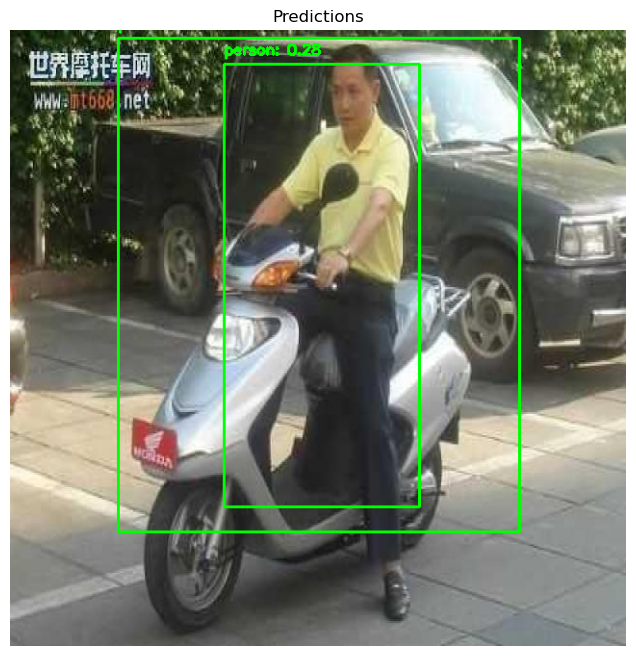

Displaying Ground Truth for Image: ../storage/logistics/IMAG0396_jpg.rf.28fd9584e4d9651a181100473bb6accf.jpg


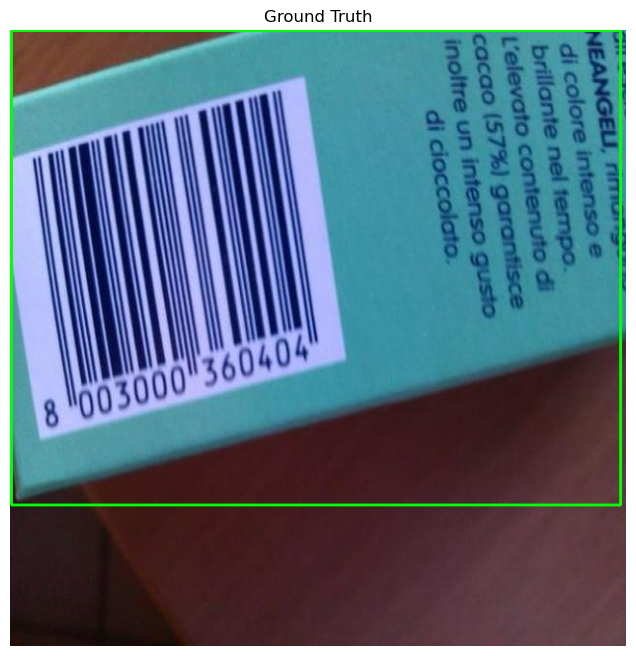

Displaying Predictions for Image: ../storage/logistics/IMAG0396_jpg.rf.28fd9584e4d9651a181100473bb6accf.jpg


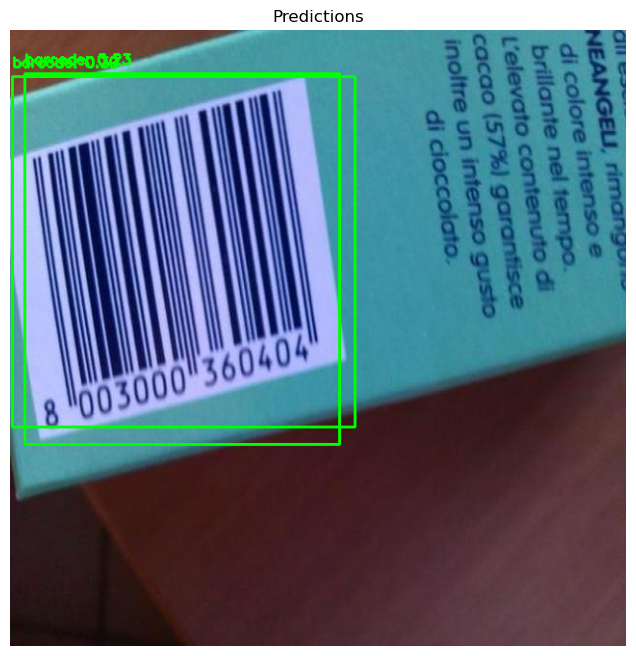

Displaying Ground Truth for Image: ../storage/logistics/312O4GMMLUOO_jpg.rf.fec8cca285ef232dc3da3e9dc57508f2.jpg


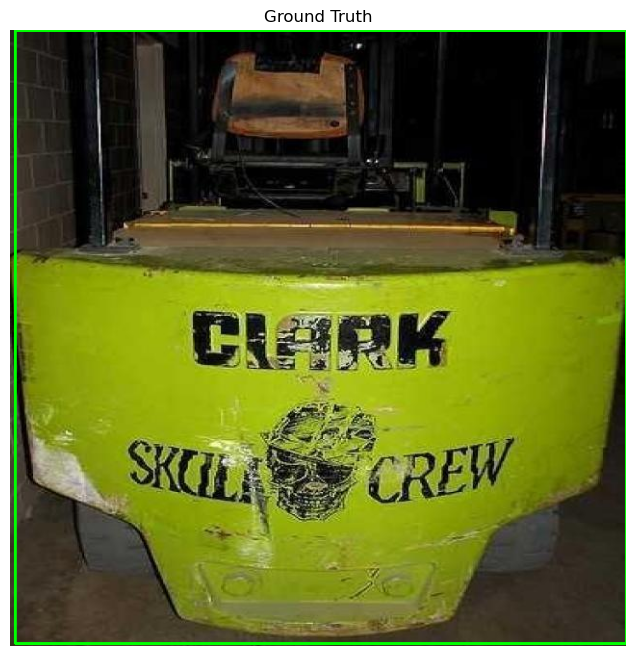

Displaying Predictions for Image: ../storage/logistics/312O4GMMLUOO_jpg.rf.fec8cca285ef232dc3da3e9dc57508f2.jpg


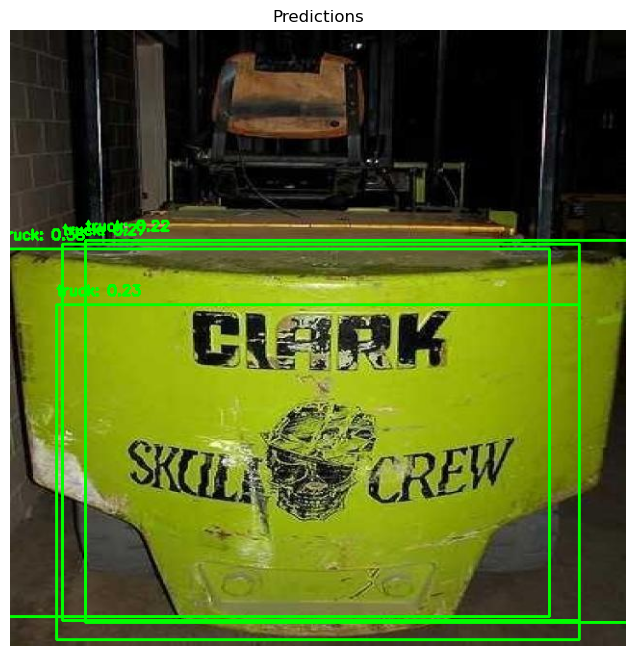

Displaying Ground Truth for Image: ../storage/logistics/r83_jpg.rf.58b5a90c0fae3bbb283d1ea8d8d09d1c.jpg


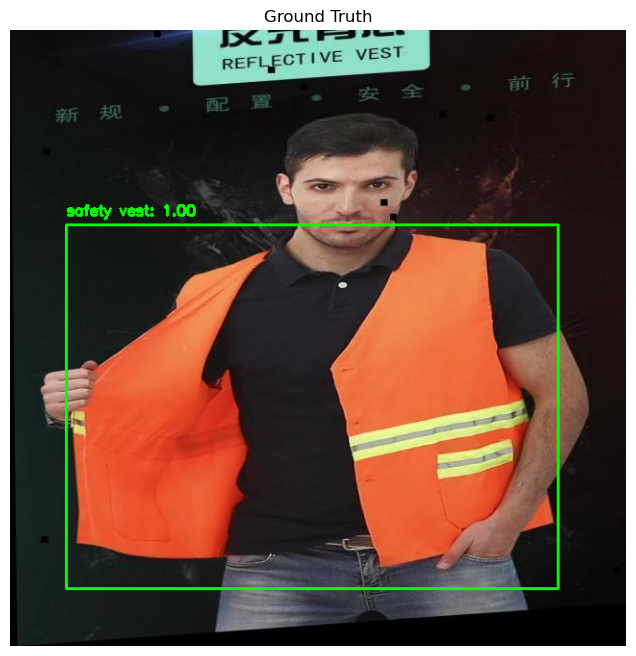

Displaying Predictions for Image: ../storage/logistics/r83_jpg.rf.58b5a90c0fae3bbb283d1ea8d8d09d1c.jpg


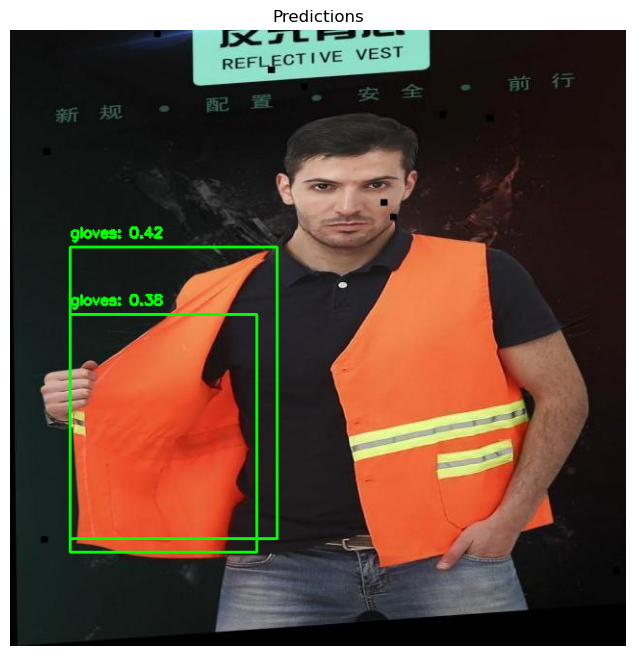

Displaying Ground Truth for Image: ../storage/logistics/EAN13_09_0088_jpg.rf.2031e0c46b10aaa695a811ce27f1ef56.jpg


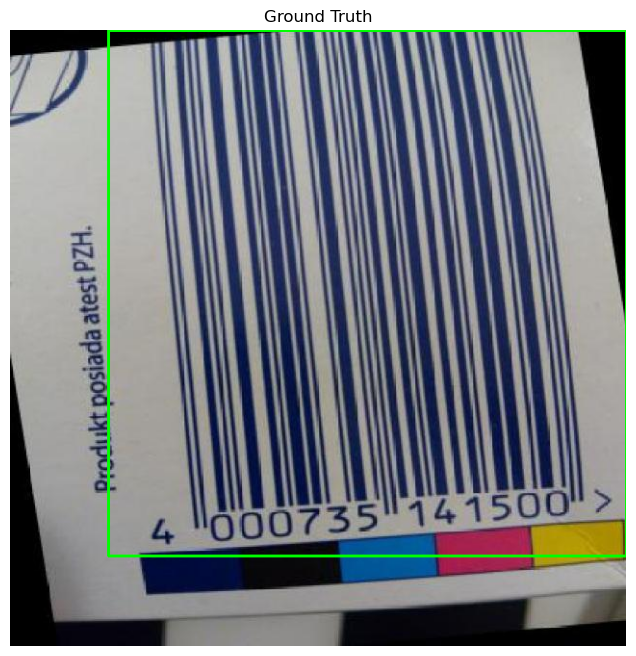

Displaying Predictions for Image: ../storage/logistics/EAN13_09_0088_jpg.rf.2031e0c46b10aaa695a811ce27f1ef56.jpg


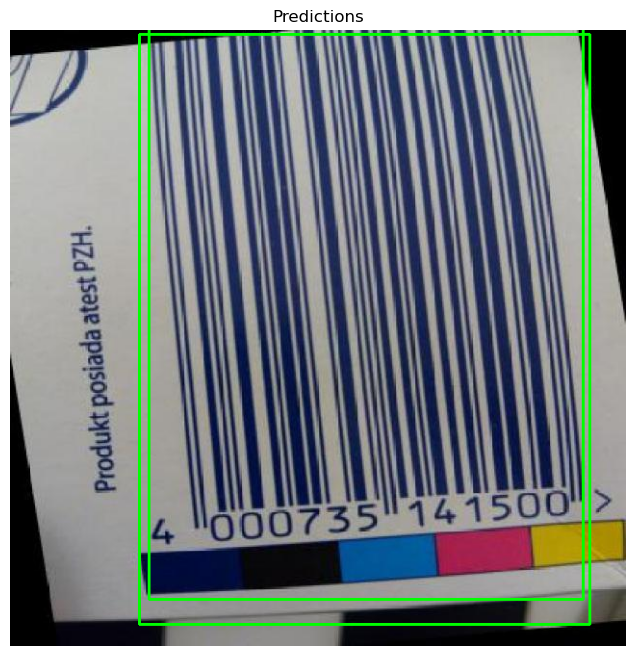

Displaying Ground Truth for Image: ../storage/logistics/JYYEUFAJ0K3P_jpg.rf.d6a39ca5bf107e71f7715f7d6651c3ed.jpg


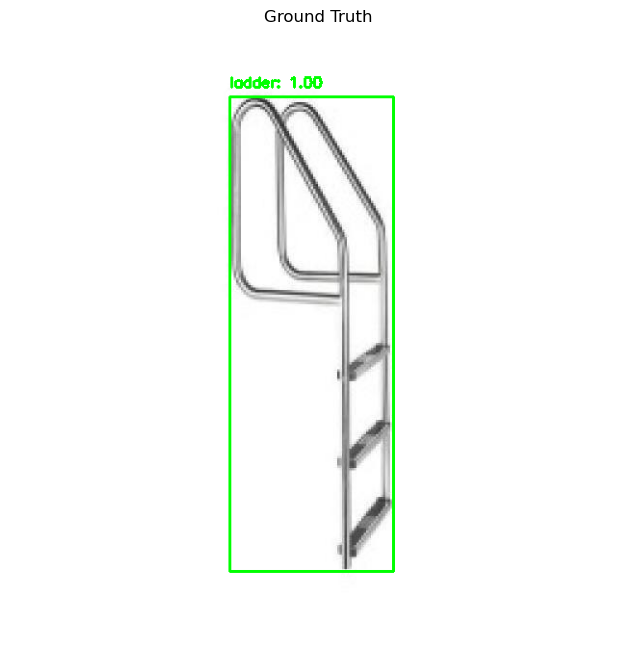

Displaying Predictions for Image: ../storage/logistics/JYYEUFAJ0K3P_jpg.rf.d6a39ca5bf107e71f7715f7d6651c3ed.jpg


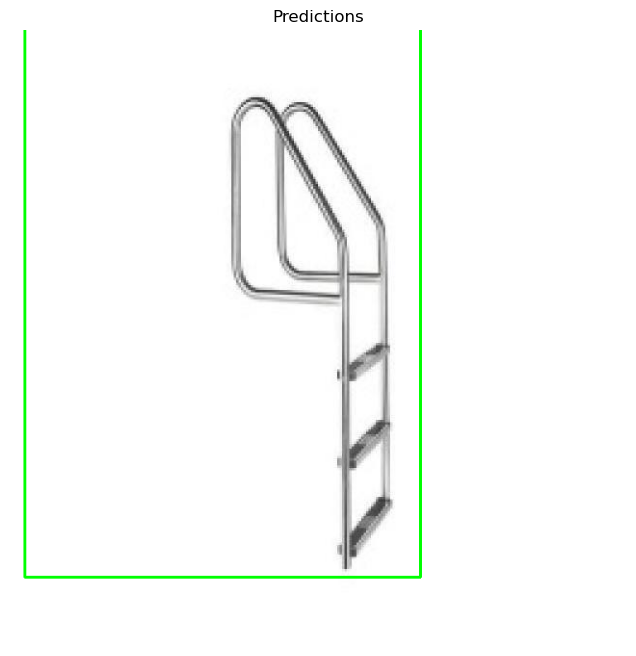

In [12]:
# Display the images with ground truth and predictions
display_images_with_gt_and_predictions(
    hard_negatives_results=hard_negatives_results, 
    hm=hm, 
    model=model_2, 
    annotation_image_dir='../storage/logistics/',  
    prediction_dir='../storage/predictions_full/'
)

## Most Common Missclassifications

The `sample_missclassifications` method loops through all prediction and annotation pairs for each image that are over the IOU threshold and counts the number of missclassifications per class. 

In [13]:
# Test the sample_misclassifications method
misclassifications_results = hm.sample_misclassifications(
    prediction_dir='../storage/predictions_full/',
    annotation_image_dir='../storage/logistics/'
)

In [14]:
# Print the results with class labels
print(f"Classes ranked by the most misclassifications:")
for class_id, count in misclassifications_results:
    class_label = model_2.classes[class_id]  # Convert class ID to class label using the model's class list
    print(f"Class Label: {class_label} (Class ID: {class_id}), Misclassifications: {count}")


Classes ranked by the most misclassifications:
Class Label: person (Class ID: 10), Misclassifications: 3441
Class Label: safety vest (Class ID: 13), Misclassifications: 2280
Class Label: helmet (Class ID: 7), Misclassifications: 916
Class Label: forklift (Class ID: 4), Misclassifications: 333
Class Label: van (Class ID: 18), Misclassifications: 308
Class Label: car (Class ID: 1), Misclassifications: 300
Class Label: ladder (Class ID: 8), Misclassifications: 142
Class Label: cardboard box (Class ID: 2), Misclassifications: 102
Class Label: road sign (Class ID: 12), Misclassifications: 62
Class Label: truck (Class ID: 17), Misclassifications: 56
Class Label: freight container (Class ID: 5), Misclassifications: 33
Class Label: wood pallet (Class ID: 19), Misclassifications: 26
Class Label: traffic light (Class ID: 16), Misclassifications: 21
Class Label: traffic cone (Class ID: 15), Misclassifications: 13
Class Label: smoke (Class ID: 14), Misclassifications: 13
Class Label: barcode (Clas

## Analysis

From our hard negative mining, the hardest images to classify depend significantly on our metrics as well as the hyperparameters like IOU threshold and lambdas for the loss functions. Above we sampled the top 10 hard negatives with two different IOU thresholds (0.5 and 0.2) and got a set of completely different photos. We see a lot of cases of missclassifications of objects that are similar to eachother like cars, trucks, and vans as well as carboard boxes and wood pallets given their similar color. Additionaly, images with fewer ground truth objects tended to have a higher loss since it would amplify and wrong predictions and false positives. 

Because of the common missclassifications seen through hard negative sampling. We added antoher metric that counted the number of missclassifications per class given a IOU threshold. The results above are pretty close to what we'd expect, objects that can be mistaked for others in low quality or dense images are very frequently missclassified. One thing that was suprising was that fire and smoke were among the lowest in missclassifcation rate. I would have thought that since fire can so often contain smoke and vice versa that these two could frequently be missclassified for eachother. However, it is important to note that we are not normalizing to the actual class count. Perhaps it would be better to measure the percent missclassification per class instead.